# 1. Popravku kontrasta slike

Lokalne operacije nad pojedinacnim pikselima predstavljaju preslikavanje inteziteta piksela ulazne slike: s = T(r)
Lokalne operacije koje sam koristila za popravak kontrasat slike su:

1. Poravak kontrasat odsecanjem
2. Razvlacenje kontrasta
3. Log transformacija
4. Stepena funkcija
5. Ekvalizacija histograma
6. Adaptivna ekvalizacija histograma

In [94]:
from pylab import *

import skimage
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import io
from skimage import util

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import numpy as np
import os

In [122]:
import imageio
#imageio.plugins.freeimage.download()

# Učitavanje HDR slike gde je svaka koordinata boje predstavljena sa 16 bita 
img = imageio.imread('street.tif', format = 'TIFF')

# Normalizacija piksela na opsegu od 0 do 1
img = img/2**16

C:\Users\Teodora\AppData\Local\Temp\ipykernel_6380\1372853110.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread('street.tif', format = 'TIFF')


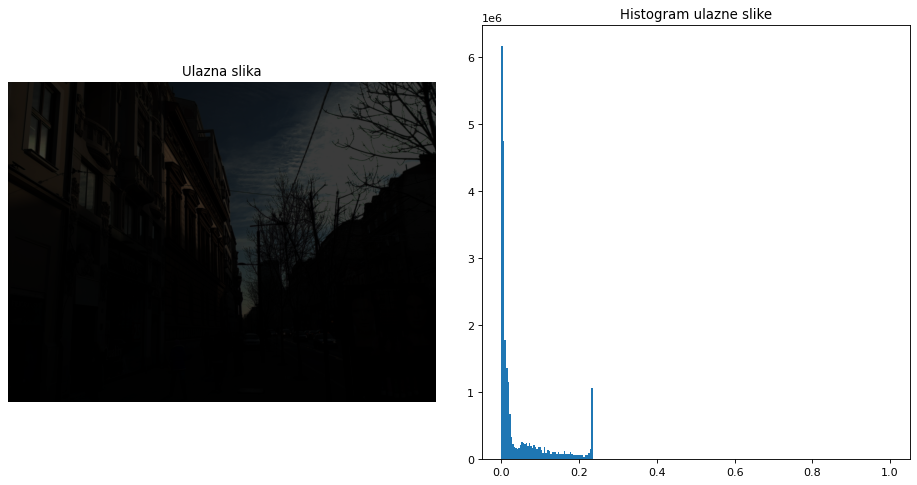

 img - Min: 0.0  Max: 0.2314300537109375
Dimenzije slike: (2448, 3264, 3)


In [123]:
# Prikaz ulazne slike i histograma ulazne slike
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80); plt.tight_layout();
ax[0].imshow(img); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
ax[1].hist(img.flatten(), bins=256, range=(0,1)); ax[1].set_title('Histogram ulazne slike'); 

plt.show()

# Min i max vrednost normalizovane slike
print(" img - Min:", np.min(img), " Max:", np.max(img))
print("Dimenzije slike:", img.shape)

### Ulazna slika

Ulazna slika sirokog dinamickog opsega gde je svaka koordinata boje predstavljenasa 16 bita je normirana sa 2^16 = 65535. Opseg tako normirane ulazne slike je (0, 0.231). Dimenzije ulazne slike su (2448, 3264, 3). Vrednosti piksela ulazne slike na histogramu su grupisani na levoj strani ka niskim vrednostima osvetnjaja. Sa histograma se moze primetiti da se najvise piksela nalazi u 0 sto rezultira pretezno tamnoj ulaznoj slici. Kontras ulazne slike nije dovoljno dobar a detalji u tamnim delovima scene nisu vidljivi, to je posledica raspodele vrednosti piksela na histogramu na relativno malom opsegu inteziteta. 

In [69]:
# Konvertovanja slike u HSV kolor sistem
img_hsv = color.rgb2hsv(img)

# Izdavajanje V komponenete HSV kolor sistema
img_v = img_hsv[:, :, 2]

In [70]:
def conv_hsv_to_rgb(img_hsv, img_v):
    
    # Funkcija koja konvertuje sliku iz HSV u RGB kolor sistem.
    # Ulazni parametri funkcije: slika konvertovana u HSV kolor sistem i slika na kojoj je izvrseno izostravanje.
    # Izlazni parametar: slika u RGB kolor sistemu na kojoj je izvrseno izostarvanje.
    
    img_hsv_out = np.zeros(shape(img_hsv))
    img_hsv_out[:,:,0:2] = img_hsv[:,:,0:2]
    img_hsv_out[:,:,2] = img_v

    img_rgb_out = color.hsv2rgb(img_hsv_out)

    return img_rgb_out

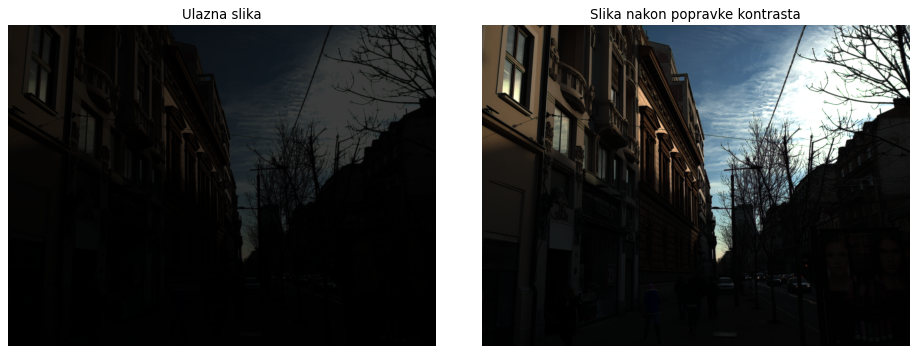

In [71]:
# 1. Popravka kontrasta odsecanjem

# Originalna slika se unutar funkcije skalira tako da vrednosti piksela u opsegu (0, 0.231) budu mapirane na opseg (0, 1).

# Primena metode odsecanja na V komponentu ulazne slike 
img_out = exposure.rescale_intensity(img, in_range=(0, 0.231), out_range=(0, 1))

# Prikaz rezultata
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80); plt.tight_layout();
ax[0].imshow(img); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
ax[1].imshow(img_out); ax[1].set_title('Slika nakon popravke kontrasta'); ax[1].axis('off');

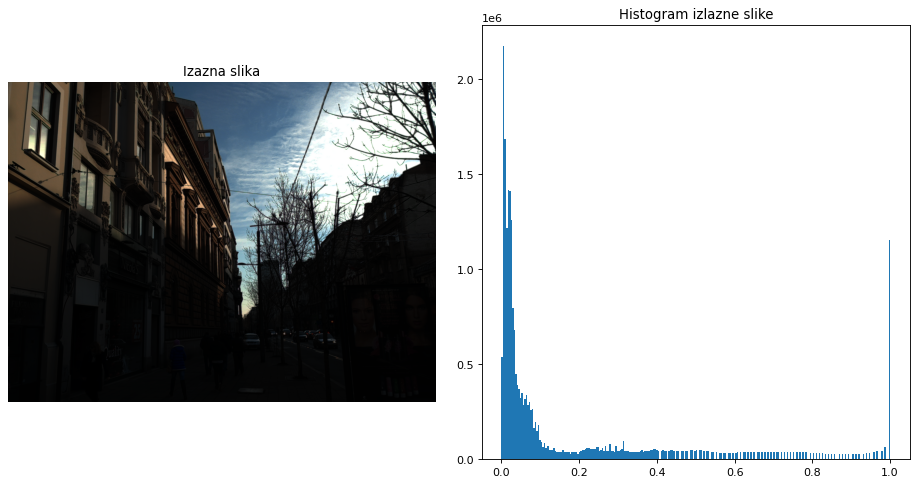

In [72]:
# Prikaz izlazne slike i histograma izlazne slike
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80); plt.tight_layout();
ax[0].imshow(img_out); ax[0].set_title('Izazna slika'); ax[0].axis('off')
ax[1].hist(img_out.flatten(), bins=256, range=(0,1)); ax[1].set_title('Histogram izlazne slike')
plt.show()

### 1. Metoda popravka kontrasta odsecanjem

Relevantne informacije o vrednosti piksela koje se nalaze u opsegu (0, 0.231) mapiram na opseg (0, 1).

Pomeranjem donje granice sa 0 na vece vrednosti dolazi do mapranja opsega (0, donja granica) originalne slike u 0, sto znaci da nakon odsecanja informacije o vrednosti pikslelima u opsegu (0, donaj granica) vise ne postoje. Primenom ovih granica moze se primetiti da tamniji delovi originalne slike postaju jos tamniji. Ovo rezultuje jos losijem kontrastu nego na ulaznoj slici kao i smanjenjem dinamičkog raspona i gubitkom detalja u tamnim dijelovima slike.

Smanjenjem gornje granice sa 0.231 na manje vrednosti dolazi do mapranja opsega (gornja granica, 0.231) originalne slike u 1. Primenom ovih granica moze se primetiti da svetliji delovi originalne slike postaju jos svetliji. Smanjenjem gornje granice povecava se broj piksela koji se mapira u 1 na taj nacin se dobija svetlija slika. Za male vrednosti gornje granice kontrast izlazne slike jeste popravljen ali su izgubljeni detalji u svetlim delovima scene.

Za opsegeg (0, 0.231) koji se mapira na opseg(0, 1) popravak kontrasat je najbolji. Na ovaj nacin razvlacimo ceo opseg ulazne slike na opseg (0, 1). Histogram izlazne slike je razvucen na ceo opseg inteziteta, sto se moze primetiti na izlaznoj slici kao popravka kontrasta. Detalji u svetlim delovima scene su bolje vidljivi ali detalji u tamnim delovima i dalje nisu vidljivi. Boje nisu prezasicene, nema gubitka informacije o detaljima u svetlim delovima scene.


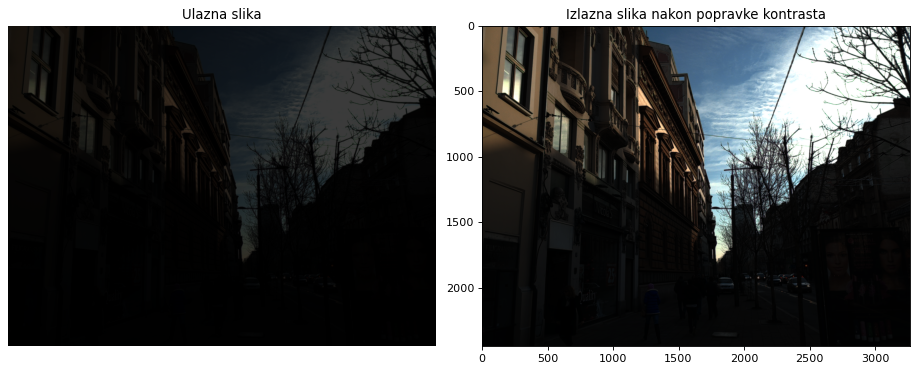

In [73]:
# 2. Metoda razvlacenja kontrasta

a = 0; b = 0.2; val_a = 0; val_b = 1

x_val = [0, a, b, 1]
y_val = [0, val_a, val_b, 1]

# Primena metode razvlacenja kontrasta na V komponentu ulazne slike 
img_out = interp(double(img), x_val, y_val)

# Prikaz rezultata
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80)
plt.tight_layout()

ax[0].imshow(img, vmin = 0, vmax = 1); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
ax[1].imshow(img_out, vmin = 0, vmax = 1); ax[1].set_title('Izlazna slika nakon popravke kontrasta')
plt.show()

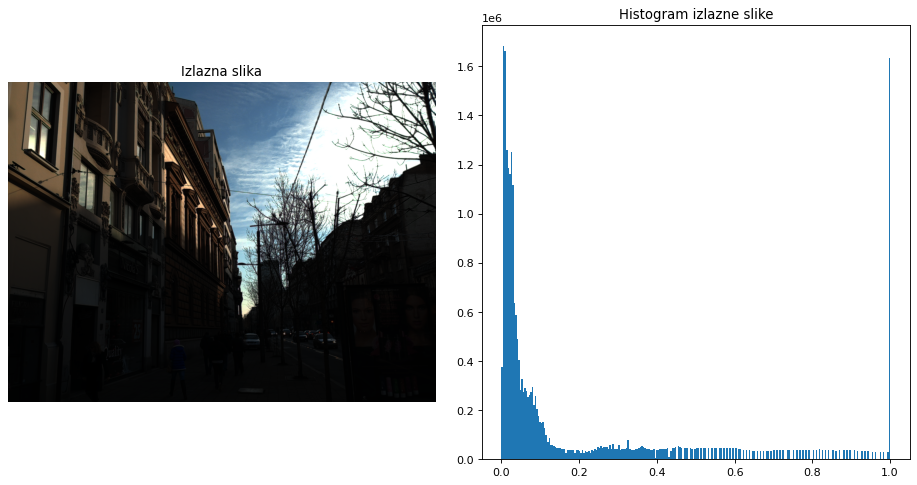

In [74]:
# Prikaz izlazne slike i histograma izlazne slike
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80); plt.tight_layout();
ax[0].imshow(img_out); ax[0].set_title('Izlazna slika'); ax[0].axis('off')
ax[1].hist(img_out.flatten(), bins=256, range=(0,1)); ax[1].set_title('Histogram izlazne slike')
plt.show()

### 2. Razvlacenje kontrasta

Funkcija koja linearno skalira vrednosti od 0 do min opsega(a) i od max opsega(b) do 1 sa nagibom koji je manji od 1, a vrednosti od min opsega do max opsega sa nagibom koji je veci od 1. Za svaku vrednost koja se nalazi u opsegu linearnom interpolacijom odredjujemo vrednosti izlazne slike.

Povecanjem parametra b ili smanjenjem parametra a povecava se opseg vrednosti piksela na koji je potrebno primeniti razvlacenje kontrasta. Razvlacenje kontrasat na opsegu (a, b) linearnom interpolacijom gde je nagib krive veci od 1 rezultuje tome da ce susedni inteziteti na ulaznoj slici biti vise razmaknuti na izlaznoj slici.

Razvlacenje kontrasat na opsegu (0, a) linearnom interpolacijom gde je nagib krive manji od 1 rezultuje tome sto su tamni delovi na ulaznoj slici jos tamniji na izlaznoj slici. Povecanje parametra a se suzava opseg vrednosti piksela na kome se nalaze relevantne informacije a povecava se broj piksela tamnijeg osvetljaja. Kako ulazna slika ima dosta tamnih piksela i detalji u tamnim delovima scene nisu primetni, povecavanje parametra a nije dobro resenje za popravak kontrasta ulazne slike.

Razvlacenje kontrasat na opsegu (b, 1) linearnom interpolacijom gde je nagib krive manji od 1 rezultuje tome sto su svetli delovi na ulaznoj slici jos svetliji na izlaznoj slici. Smanjenjem parametra b se suzava vrednost piksela na kome se nalaze relevantne informacije a povecava se broj piksela svetlijeg osvetljaja. Max vrednost parametra b je 0.231 je je opseg slike (0, 0.231). Smanjenjem parametra b se moze popravti kontrast slike. Vrednosti parametra b koje su manje od 0.1 nisu pogodne za popravak kontrasta jer slika izgleda previse svetlo i gube se informacije o detaljiva u svetlim delovima slike.

Sa histogram izlazne slike se moze primetiti veliki pik u 1 sto je posledica toga da su svi svetli pikseli u opsegu(0.2, 0,231) mapirani u 1.

In [75]:
def plot_img_and_hist(image, axes, bins=256):
    
    # Funkcija se koristi za iscrtavanje slike, njenog histograma i kumulativnog histograma.
   
    # Konvertira sliku u tip float kako bi se osiguralo da svi pikseli budu u opsegu od 0 do 1.
    image = skimage.img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()
    
    # Iscrtavanje slike
    ax_img.imshow(image, cmap='gray', vmin=0, vmax=1); ax_img.set_axis_off()
    
    # Iscrtavanje histograma
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='b')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0,0))
    ax_hist.set_xlabel('Intenzitet piksela')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])
    
    # Iscrtavanje kumulativnog histograma
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])
    
    return ax_img, ax_hist, ax_cdf

low_in = 0.0008697509765625
high_in = 0.2314300537109375


C:\Users\Teodora\AppData\Local\Temp\ipykernel_6380\708584106.py:28: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  axes = np.zeros((2, 4), dtype=np.object)


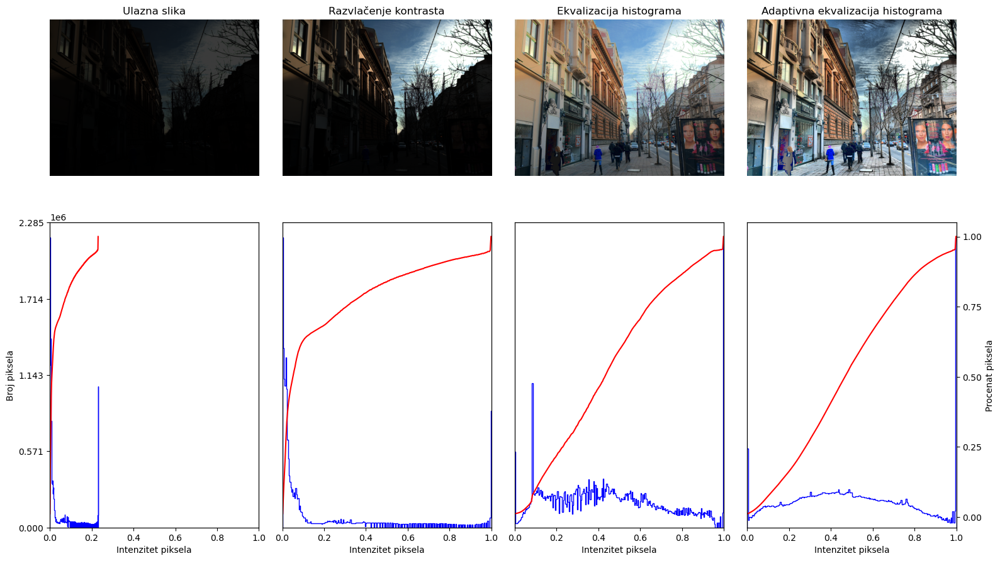

In [78]:
# 3. Razvlačenje kontrasta zanemarivanjem najsvetlijih i najtamnijih piksela

# Zanemarujem 2% najsvetlijih i 98% najtaminijih kako bi se ostatk piksela sto bolje reprezentovao
p2, p98 = np.percentile(img, (2, 98))

# Low_in i High_in vrednosti
print('low_in = ' + str(p2))
print('high_in = ' + str(p98))    

# Primena metode razvlacenja kontrasta na V komponentu ulazne slike 
img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))
img_rescale_hsv = color.rgb2hsv(img_rescale)

# 4. Ekvalizacija histograma

# Primena metode ekvalizacije histograma na V komponentu ulazne slike 
img_eq = exposure.equalize_hist(img_rescale_hsv[:, :, 2])
img_eq = conv_hsv_to_rgb(img_rescale_hsv, img_eq)

# 5. Adaptivna ekvalizacija histograma sa ograničenjem kontrasta

# Primena metode adaptivne ekvalizacije histograma na V komponentu ulazne slike 
img_adapteq = exposure.equalize_adapthist(img_rescale_hsv[:, :, 2], clip_limit=0.5)
img_adapteq = conv_hsv_to_rgb(img_rescale_hsv, img_adapteq)

# Prikaz rezultata
fig = plt.figure(figsize=(16, 10))
axes = np.zeros((2, 4), dtype=np.object)

#fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16,10), dpi=120)
#axes = ax.ravel()

axes[0,0] = fig.add_subplot(2, 4, 1)
for i in range(1,4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0,4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:,0])
ax_img.set_title('Ulazna slika')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Broj piksela')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale, axes[:,1])
ax_img.set_title('Razvlačenje kontrasta')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq, axes[:,2])
ax_img.set_title('Ekvalizacija histograma')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:,3])
ax_img.set_title('Adaptivna ekvalizacija histograma')

ax_cdf.set_ylabel('Procenat piksela')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# sprečava preklapanje oznaka na y-osi
fig.tight_layout()
plt.show()

### 3. Odescanje sa zanemarivanjem najsvetlijih i natamnijih piksela

Rucno odredjivanje parametar opsega kao u slucaju odsesanja i razvlacenja nije primenljivo u opsitim sitaucijama. Parametre je potrebno odrediti na osnovu toga kakva je statistika slike koja se obradjuje. 

Ako se na slici odredi piksel sa min i max vrednosti velika mogucnost je da opseg slike bude (0, 1). Ovo se desava jer je dovoljan bar jedan piksel koji ima vrednost 0 ili 1 da bi postao min ili max vrednost piksela na slici. Iz tog razloga potrebno je zanemariti 2% najsvetlijih i 98% najtamnijih na slici kako bi dobijeni rezultati min i max vrednosti piksela na slici bili verodostojni. Nakon izbora min imax vrednosti piksela izvrseno je mapiranje opsega(low_in, high_in) u opseg(0, 1).

Vrednost piksela koji je veci od 2% vrednosti svih piksela je  0.000869 a vrednost piksela koji veci od 98% vrednosti svih piksela je 0.231430. Opseg (0.231430, 1) se mapira u 1 a opseg(0, 0.000869) se mapira u 0. Detalji na slici u svetlijim delovima scene nakon poravka kontrasta su bolje izrazeni ali i dalje nisu vidljivi detalji u tamnim delovima scene. Iz tog razloga popravak kontrasata primenom ove metode nije dovoljno ucinkovito.

I ako je primetno razvlacenje kontrasata na histogramu, kumulativna funkcija ima strm skok zbog visokok pika u 0. Zbog nedovoljno linearne karakteristike kumulativne funkcije ova metoda nije dovoljno ucinkovita za popravak kontrasta. 

 ### 4. Ekvalizacija histograma

Ideja ekvalizacije histograma je da se pronadje odgovarajuca funkcija koja ce transformisati ulaznu sliku u sliku sa uniformno rasporedjenim histogramom. Pracenjem histograma i kumulativne funkcije raspodele mozemo odrediti koji pristup daje najbolje rezultate u poboljsanju kontrasta ulazne slike. Kumulativna funkcija tezi da od histograma ulazne slike napravi uniformni histogram.

Mali opseg vrednosti ulazne slike se mapiran na ceo opseg intezitet sto moze rezultirati pojavom suma. Iz tog razloga evalizaciju histograma je dobro primeniti na slici koja ima razvucen kontrast.

Nakon primene ekvalizacije histograma, raspodela histograma je priblizna uniformnoj raspodeli a visok pik u 0 je nestao. Kumulativna funkcija je sada linerana. Na izlaznoj slici primetan je popravak kontrasat, detalji su vidljivi i u svetlijim i u tamnijim delovima scene a boje nisu zasicene.

### 5. Adaptivna ekvalizacija histograma

Problem kod ekvalizacije histograma je to sto se mali opseg vrednosti razvlaci na ceo opseg inteziteta. Kao posledica ovog problema moze doci do pojave suma. Resenje je primena ekvalizacije histograma sa ogranicenjem kontrasta. Parametar clip_limit odredjuje koliko agresivno zelimo da izvrsimo ekvalizaciju histograma. Vrsimo odsecanje svih vrednosti histograma koje su vece od vrednosti parametra clip_limit. Na taj nacin ogranicavamo max nagib transformacione funkcije kako bi se izbeglo prenaglasavanje kontrasta u nekim regionima slike. 

Problem ekvalizacije histograma sa ogranicenjem kontrasta je taj sto vrsimo modifikaciju piksela istom funkcijom i ako pikseli pripadaju lokalnim regionima koji imaju razlicite lokalne statistike. Resenje je primen adaptivne ekvalizacije sa ogranicenjem kontrasat. Primen adaptivne ekvalizacije sa ogranicenjem kontrasta, funkcija preslikavanja se racuna posebno za svaki piksel na osnovu raspodele inteziteta u lokalnom susedstvu.

Rezultati primene adaptivne ekvalizacije histograma zavise od parametra clip_limit. 
Ako je clip_limit postavljen na veću vrednost, ekvalizacija histograma će biti agresivnija i može dovesti do povećanja kontrasta na mestima gde ima velikih varijacija. Sa druge strane, postavljanje nižeg clip_limit-a može biti korisno kada želimo očuvati suptilnije detalje i smanjiti pojačanje šuma. Niži clip limit će ograničiti nagib transformacione funkcije i time zadržati kontrast na manjem opsegu intenziteta.

Izlazna slika je najbolja za clip_limt = 0.5 ali odredjene boje su zasicene.

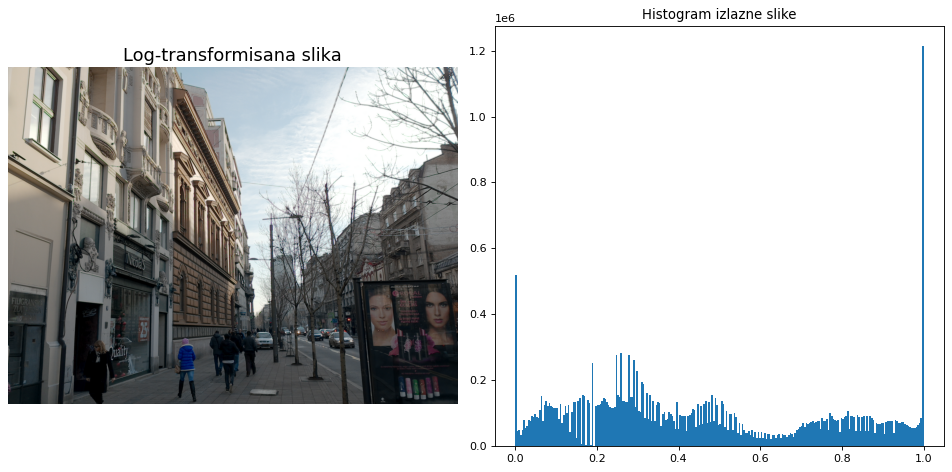

In [53]:
# Definicija funkcije logaritamske transformacije
def log_transform(f, axes, c):
    g = log(1 + (10**c)*f)/log(1+10**c)
    
    # Prikaz rezultata
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), dpi=80)
    ax = axes.ravel()

    ax[0].imshow(g); ax[0].set_axis_off(); ax[0].set_title('Log-transformisana slika', fontsize=16)
    ax[1].hist(g.flatten(), bins=256, range=(0,1)); ax[1].set_title('Histogram izlazne slike')
    plt.tight_layout()
    
# Pozivanje interaktivnog sučelja za prilagodbu parametra c 
#interact(log_transform, f=fixed(img_rescale), axes=fixed(axes), c=(0,10,0.2))

# 6. Primena log transformacije
log_transform(img_rescale, axes, c = 2.2)

### 6. Log transformacija

Logaritamska transformacija se često  koristi za poboljšanje kontrasta na slikama koje imaju visok dinamički raspon (razlika između tamnih i svetlih dijelova) i smanjenu vidljivost detalja. Logaritamska transformacija obično se primjenjuje na slike koje imaju problem sa osvetljenim deovima, gde su detalji slabo vidljivi. Transformacija može uticati na isticanje  detalje u tamnim delovima slike, čime se čini da se razlike između tamnih nijansi bolje vide.

Transformaciju primenjujem na slici img_rescale koja ima razvucen opseg na ovaj nacin se dobija bolji popravak kontrasta nego kad se transformacija primenjuje na ulaznu sliku.

Rezultati dobijeni primenom log transformacije za c < 1.5 ili c > 2.5 nimu zadovoljavajuci. Povecavanjem parametra c povecava se strmost log funkcije sto rezultuje mapiranju opsega niskih inteziteta piksela u opseg visokih inteziteta piksela. Strmija karakteristika agresivnije povecava kontrast u tamnim delovima scene. Izlazna slika postaje svetlija. 

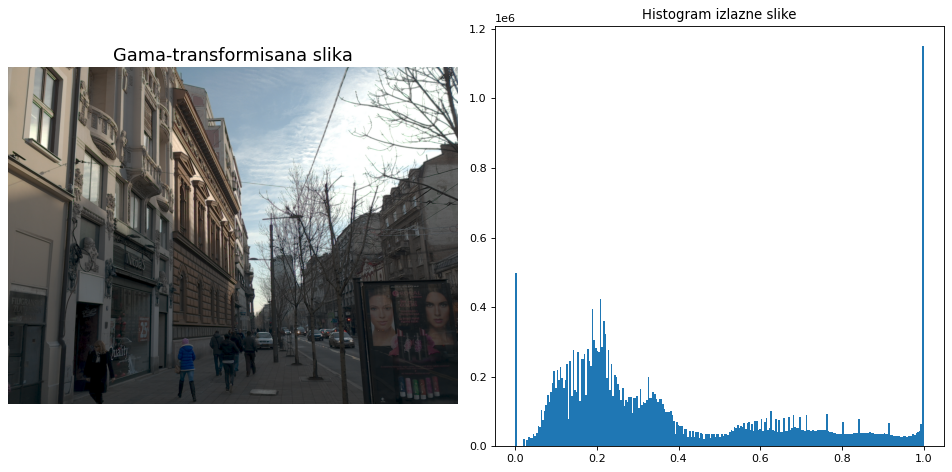

In [49]:
# Definicija funkcije gama transformacije
def gamma_transform(f, axes, c=0.5):
    g = f**c
    
    # Prikaz rezultata
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), dpi=80)
    ax = axes.ravel()

    ax[0].imshow(g); ax[0].set_axis_off(); ax[0].set_title('Gama-transformisana slika', fontsize=16)
    ax[1].hist(g.flatten(), bins=256, range=(0,1)); ax[1].set_title('Histogram izlazne slike')
    plt.tight_layout()
    
# Pozivanje interaktivnog sučelja za prilagodbu parametra c 
#interact(gamma_transform, f=fixed(img_rescale), axes=fixed(axes), c=(0,1,0.02))

# 7. Primena gama transformacije
gamma_transform(img_rescale, axes, c = 0.4)

### 7. Stepena transformacija

Vrednost parametra c koji daje najbolji rezulat je 0.4. Izlazna slika ima popravljen kontrast i vidljive detalje u svim delovima scene. Nema potrebe razmatrati rezultate za vrednosti parametra c vece od 1, jer je ulazna slika tamna tako da primenom transformacije za c vece od 1 se dobija samo jos tamnija slika.

Transformaciju primenjujem na slici img_rescale koja ima razvucen opseg na ovaj nacin se dobija bolji popravak kontrasta nego kad se transformacija primenjuje na ulaznu sliku.

c < 1: Ako postavimo parametar c na vrednost manju od 1, slika ce postati svjetlija i kontrast ce se smanjiti. Ovo moze biti korisno za ublažavanje kontrasta i isticanje detalja u svetlim delovima slike. Strmija karakteristika agresivnije povecava kontrast u tamnim delovima scene.

c = 1: Ako postavimo parametar c na 1, slika ostaje nepromenjena.

c > 1: Ako postavimo parametar c na vrednost vecu od 1, slika će postati tamnija i povecace se kontrast. Ovo moze poboljšati vidljivost detalja u tamnim dijelovima slike.

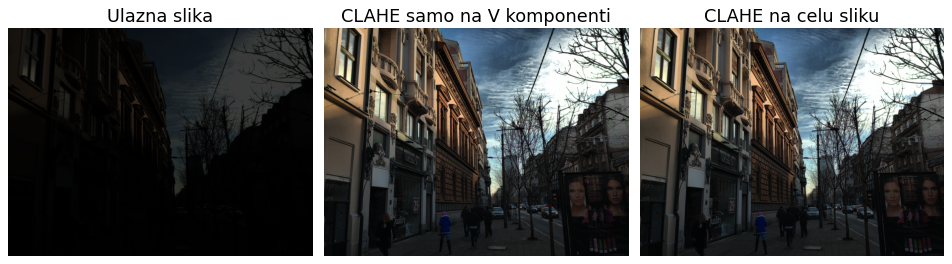

In [52]:
[height, width, planes] = shape(img)

# Primena metode adaptivne ekvalizacije histograma sa ogranicenjem kontrasat na V komponentu ulazne slike   
v_out = exposure.equalize_adapthist(img_hsv[:, :, 2], [height/8, width/8], clip_limit=0.02, nbins=255)
img_out = conv_hsv_to_rgb(img_hsv, v_out)

# Primena metode adaptivne ekvalizacije histograma sa ogranicenjem kontrasat na celu sliku
img_out_1 = exposure.equalize_adapthist(img, [height/8, width/8], clip_limit=0.02, nbins=255)

# Prikaz rezultata
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 6), dpi=80)
ax = axes.ravel()

ax[0].imshow(img); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16)
ax[1].imshow(img_out); ax[1].set_axis_off(); ax[1].set_title('CLAHE samo na V komponenti', fontsize=16)
ax[2].imshow(img_out_1); ax[2].set_axis_off(); ax[2].set_title('CLAHE na celu sliku', fontsize=16)
plt.tight_layout()

Rezultati dobijeni primenom metode adaptivne ekvalizacije histograma sa ogranicenjem kontrasat na celoj ulazno slici kao i samo na V komponenti ulazne slike su isti ali se znatno razlikulu u odnosu na dobijene rezultate primenom iste metode na sliku koja ima razvucen kontrast.

#### Zakljucak

Nakon primene vise pristupa, mogu zakljuciti da je adaptivna ekvalizacija histograma najbolji pritup za poboljsanje kontrasta u ovom slucaju. Jer pomaze u pojačavanju kontrasta detalja na slici i očuvanju informacija o osvetljenim delovima slike. Histogram ulazne slike ima dosta visoke pikove koncentrisane na levoj strani koji mogu stvoriti odredjene probleme kao sto je  sum na izlaznoj slici. Ovaj potencijalni problem se moze resiti primenom adaptivne ekvalizacije histograma sa ogranicenjem kontrasta.

In [91]:
# Konvertujte sliku u uint8 format
equalized_image_uint8 = exposure.rescale_intensity(img_adapteq, out_range='uint8')

# Sačuvajte poboljšanu sliku u JPEG formatu
io.imsave('street_out.jpg', equalized_image_uint8)

# Prikaz informacija o sacuvanoj slici
print("Tip podataka:", equalized_image_uint8.dtype)
print("Dimenzije slike:", equalized_image_uint8.shape)

Tip podataka: uint8
Dimenzije slike: (2448, 3264, 3)


# 2. Izostravanje slike

Izostravanjem se isticu ivice na slici cime se poboljsava vizuelni utisak.
Metode koje se mogu koristiti za izostravanje slike su:

1. Izostravanje slike koriscenjem Laplasijana
2. Izostravanje isticanjem visokih ucestanosti(unsharp mask)

In [2]:
from pylab import *

import skimage
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import io
from skimage import util

from scipy import ndimage

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import numpy as np
from skimage import img_as_ubyte

In [3]:
# Učitavanje slike
img_rgb = util.img_as_float(io.imread('miner.jpg'))

# Konvertovanja slike u YUV kolor sistem
img_yuv = color.rgb2yuv(img_rgb)

# Izdavajanje Y komponenete YUV kolor sistema
img_y = img_yuv[:,:,0]

# Informacije o detaljima koje želimo istaći nalaze se u sivoj komponenti slike.
# Zbog toga se slika konvertuje u YUV kolor sistem, izdvajajući njenu Y komponentu koja će biti korišćena u procesu izoštravanja u narednim koracima.
# Ovaj pristup konverzije u YUV kolor sistem omogućava nam fokusiranje na luminance (svetlosnu) komponentu slike (Y),
# gde su često smešteni ključni vizuelni detalji. Kombinovanjem ove komponente sa odabranim metodama izoštravanja, 
# možemo naglasiti karakteristike slike na način koji ističe željene detalje, čime postižemo poboljšanje kvaliteta slike.

In [4]:
def conv_yuv_to_rgb(img_yuv, img):
    
    # Funkcija koja konvertuje sliku u RGB kolor sistem.
    # Ulazni parametri funkcije: slika konvertovana u YUV kolor sistem i slika na kojoj je izvrseno izostravanje.
    # Izlazni parametar: slika u RGB kolor sistemu na kojoj je izvrseno izostarvanje.
    
    img_yuv_out = np.zeros(shape(img_yuv))
    img_yuv_out[:,:,1:3] = img_yuv[:,:,1:3]
    img_yuv_out[:,:,0] = img

    img_rgb_out = color.yuv2rgb(img_yuv_out)

    # Normalizacija piksela na opsegu od 0 do 1
    img_rgb_out = np.clip(img_rgb_out, 0, 1)
    
    return img_rgb_out

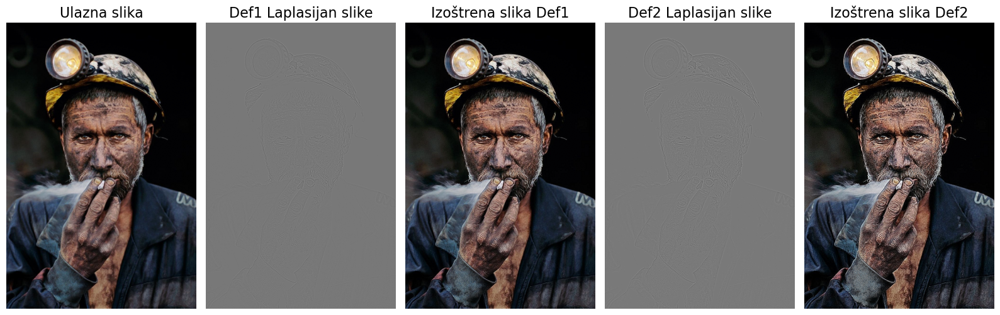

In [5]:
# Def1 Laplasijanove maske
# Suma svih elemenata maske mora biti 1.
laplacian_mask = np.array([ [0,  1, 0],
                            [1, -4, 1],
                            [0,  1, 0] ])

# Za primenu ove prostorne maske dobijaju se istirezultati ali onda img_sharp = img_y + img_lap
# laplacian_mask = np.array([ [0,  -1, 0],[-1, 4, -1],[0,  -1, 0] ])

# Ako se uvedu i dijagonalni elementi
# Def2 Laplasijanove maske
# Suma svih elemenata maske mora biti 1.
laplacian_mask_1 = np.array([ [1,  1, 1], 
                              [1, -8, 1], 
                              [1,  1, 1] ])

# Primenjivanje Laplasove maske
img_lap = ndimage.correlate(img_y, laplacian_mask)
img_lap_1 = ndimage.correlate(img_y, laplacian_mask_1)

# Izoštravanje slike(Rezultat Laplasijana se oduzima od originalne slike)
img_sharp = img_y - img_lap
img_sharp_1 = img_y - img_lap_1

# Konvertovanje izoštrene slike iz YUV u RGB
img_sharp = conv_yuv_to_rgb(img_yuv, img_sharp)
img_sharp_1 = conv_yuv_to_rgb(img_yuv, img_sharp_1)

# Prikaz rezultata
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(16,8), dpi=100)
ax = axes.ravel()

ax[0].imshow(img_rgb, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16)
ax[1].imshow(img_lap, cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Def1 Laplasijan slike', fontsize=16)
ax[2].imshow(img_sharp, cmap='gray', vmin=0, vmax=1); ax[2].set_axis_off(); ax[2].set_title('Izoštrena slika Def1', fontsize=16)
ax[3].imshow(img_lap_1, cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('Def2 Laplasijan slike', fontsize=16)
ax[4].imshow(img_sharp_1, cmap='gray', vmin=0, vmax=1); ax[4].set_axis_off(); ax[4].set_title('Izoštrena slika Def2', fontsize=16)
plt.tight_layout();

### 1. Izostravanje slike koriscenjem Laplasijana

Laplasov operator je diferencijalni operator koji izračunava drugi prostorni izvod slike, čime se dobija naglašavanje ivica i detalja. Veličina prostorne maske koja se koristi za primenu Laplasijana utice na kvalitet rezultata izoštravanja. Prostorne maske 3x3 se često koriste kada je potrebno naglasiti fine detalje, ali mogu povećati osetljivost na šum.

#### Laplasijan slike
Kada se primeni na sliku, Laplasijanov operator naglašava regione gde je intenzitet slike naglo promenjen.
Prelazak sa svetlog na tamno na ulaznoj slici sa ovako definisanom Lapsovom maskom(negativan element (1, 1)) proizvodi jedan niski pik i posle njega jedan visoki pik. Dok prelazak sa tamnog na svetlo na ulaznoj slici sa ovako definisanom Lapsovom maskom(negativan element (1, 1)) proizvodi jedan visoki pik i posle njega jedan niski pik. Za uniformne povrsine Laplasova maska daje vrednost 0. Inteziteti pikova zavise od toga koliko je velika promena u osvetljaju.

Prilagodjavanjem vrednosti u matrici se moze uticati na jacinu i prirodu detekcije ivica ili promena u intenzitetu. Ukoliko zelite naglasiti fine detalje i suptilne promene u intenzitetu, mozete poveccati vrednost koeficijenta u sredini Laplasove maske. S druge strane, ako želite da postignete izrazeniji efekat detekcije ivica, mozete eksperimentisati s vrednostima oko ivica matrice. Ako je koeficijent u sredini Laplasove maske znacajno veci od ostalih, to moze dovesti do pojacavanja finih detalja, ali moze i uzrokovati pojavu suma.

Uvodjenjem diagonalnih elemenata u Laplasovu masku dobija se izostrenija slika. Inteziteti pikovi pri prelasku sa svetlog na tamno i obrnuto su veci.

#### Izostrena slika
Izostrena slika ima ostrije ivice i izrazenije detalje. Prekomerno izoštravanje moze dovesti do pojave suma i pojave neprirodnih detalja na slici. Bitno je prilagoditi parametre izostravanja kako bi se postigli zeljeni vizuelni efekat, izbegavajuci prekomerno izostravanje koje moze dovesti do gubitka informacija ili pojave suma.

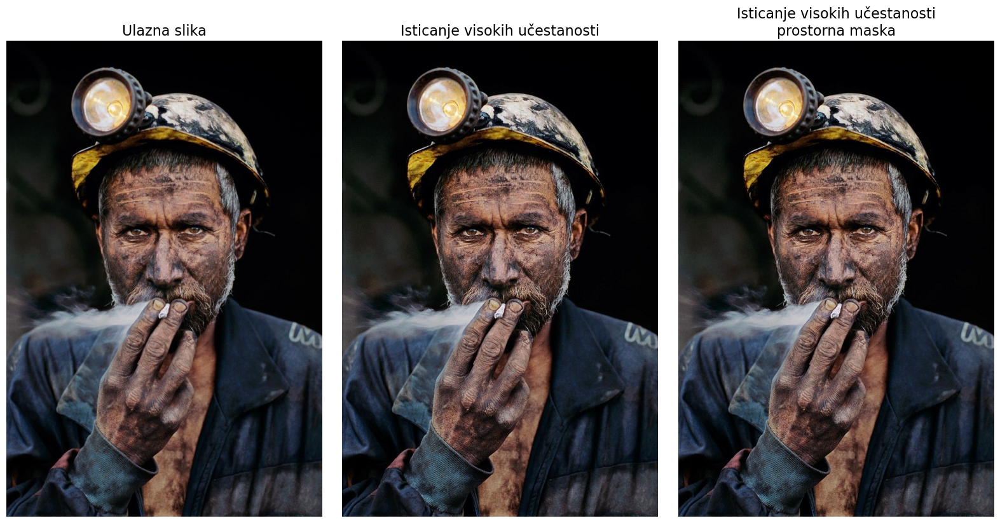

max abs diff   = 0.5442039215686277



In [6]:
# Definisanje nisko frekvencijskog filtra
lowpass_mask = np.ones(shape=(3,3))/9

# 1. Filtriranje originalne slike nisko frekvencijskim filtrom kako bi se dobila zamucena slika
img_blurred = ndimage.correlate(img_y, lowpass_mask)

# 2. Informacija o detaljiva
img_details = img_y - img_blurred

# 3. Dodavanje informacije o detaljima na originalnu sliku
img_sharp_2 = img_y + img_details

# Konvertovanje izoštrene slike iz YUV u RGB
img_sharp_2 = conv_yuv_to_rgb(img_yuv, img_sharp_2)

# Prostorna maska za izostravanje isticanjem visokih ucestanosti
# Suma svih elemenata maske mora biti 1.
sharp_mask = np.array([[-1, -1, -1],[-1, 17, -1],[-1, -1, -1]])/9

# Primenom ove prostorne maske dobijaju se slicni rezultati
#sharp_mask = np.array([[-1, -2, -1],[-2, 19, -2],[-1, -1, -1]])/7

# Primenom ove prostorne maske dobijaju se slicni rezultati
#sharp_mask = np.array([[0, -1, 0],[-1, 5, -1],[0, -1, 0]])

img_sharp_3 = ndimage.correlate(img_y, sharp_mask)

# Konvertovanje izoštrene slike iz YUV u RGB
img_sharp_3 = conv_yuv_to_rgb(img_yuv, img_sharp_3)

# Prikaz rezultata
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8), dpi=100)
ax = axes.ravel()

ax[0].imshow(img_rgb, cmap='gray', vmin=0, vmax=1); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16)
ax[1].imshow(img_sharp_2, cmap='gray', vmin=0, vmax=1); ax[1].set_axis_off(); ax[1].set_title('Isticanje visokih učestanosti', fontsize=16)
ax[2].imshow(img_sharp_3, cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('Isticanje visokih učestanosti\nprostorna maska', fontsize=16)

plt.tight_layout()
plt.show()

# Maximalna apsolutna razlika izmedju slika
print("max abs diff   = " + str(max(abs(img_sharp.flatten()-img_sharp_1.flatten()))) + "\n")

### 2. Izostravanje slike isticanjem visokih ucestanosti

Izostravanje slike isticanjem visokih ucestanosti se moze primeniti na dva nacina:

1. Primenom prostornih maske za izostravanje
2. Primenom nisko frekvencijskog filtra(unsharp mask).

#### Primenom nisko frekvencijskog filtra (Unsharp Mask):

1. Filtriranje originalne slike nisko frekvencijskim filtrom ima efekat zamućivanja, jer niski frekvencijski filter prolazi samo kroz sporije promene u intenzitetu, čime se stvaraju glatke, blago zamagljene slike.

2. Izdvajanje informacija o detaljima postiže se oduzimanjem zamućene slike od originalne slike, što rezultuje naglašavanjem visokofrekventnih komponenti slike, tj. detaljima.

3. Dodavanjem informacija o detaljima natrag na originalnu sliku, stvarate izoštrenu verziju slike koja naglašava fine detalje.

#### Primena prostorne maske za izoštravanje:

Primenom prostornih maski za izoštravanje koristi se kvadratna matrica (maska) čiji se elementi primenjuju na svaki piksel slike putem konvolucije.
Suma svih elemenata maske mora biti 1, a elementi maske mogu biti pozitivni i negativni. Ovo omogućava fine podešavanje jačine izoštravanja.
Primenom različitih maski može se postići sličan efekat izoštravanja, a maksimalna apsolutna razlika između slika dobijenih različitim maskama je zanemarljivo mala. To ukazuje na sličnost rezultata izoštravanja, bez obzira na specifičnosti korištene maske.

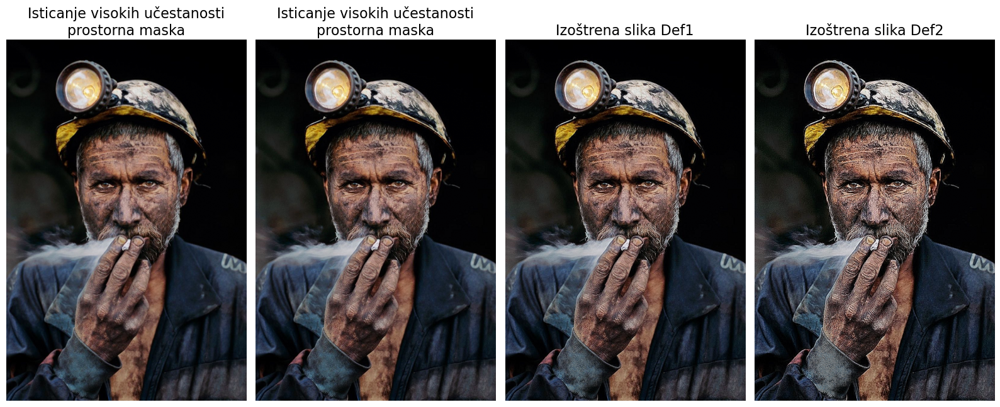

In [8]:
# Uporedjivanje dobijenih rezultata
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16,8), dpi=100)
ax = axes.ravel()

ax[0].imshow(img_rgb, cmap='gray', vmin=0, vmax=1); ax[0].set_axis_off(); ax[0].set_title('Isticanje visokih učestanosti\nprostorna maska', fontsize=16)
ax[1].imshow(img_sharp_2, cmap='gray', vmin=0, vmax=1); ax[1].set_axis_off(); ax[1].set_title('Isticanje visokih učestanosti\nprostorna maska', fontsize=16)
ax[2].imshow(img_sharp, cmap='gray', vmin=0, vmax=1); ax[2].set_axis_off(); ax[2].set_title('Izoštrena slika Def1', fontsize=16)
ax[3].imshow(img_sharp_1, cmap='gray', vmin=0, vmax=1); ax[3].set_axis_off(); ax[3].set_title('Izoštrena slika Def2', fontsize=16)

plt.tight_layout()
plt.show()

### Zakljucak

Analizom dobijenih rezultata, mogu izvući zaključak da je izlazna slika dobijena primenom Laplasijanove maske Def1 najoptimalnija. Ova slika pruža oštar izgled bez prenaglašenih detalja ili prisutnosti šuma. U poređenju sa slikom dobijenom primenom izoštravanja slike isticanjem visokih učestanosti, Laplasijanova maska Def1 pruža izoštrenost bez gubitka prirodnosti.

Nasuprot tome, slika dobijena primenom Laplasijanove maske Def2 (maska sa dijagonalnim elementima) pokazuje neprirodan izgled sa primetnom pojavom šuma. Dijagonalni elementi ove maske često dovode do prenaglašavanja dijagonalnih kontura, što može rezultirati gubitkom prirodnosti slike.

Laplasijanova maska Def1 se pokazala kao najbolji izbor jer pruža izoštrenost bez prekomernog pojačavanja detalja ili pojave šuma. Ova analiza ukazuje na važnost odabira odgovarajuće maske u procesu obrade slika kako bi se postigao željeni vizuelni efekat.

In [ ]:
# Pretvori sliku u uint8
# Skalirati vrednosti float64 slike u opseg [0, 255] i pretvoriti ih u uint8 format pre cuvanja.
img_sharp_uint8 = img_as_ubyte(img_sharp)

# Sacuvaj sliku
io.imsave('miner_sharp.jpg', img_sharp_uint8)

# 3. Adaptivna ekvalizacija histograma sa ogranicenjem kontrasta - CLAHE

CLAHE (Contrast Limited Adaptive Histogram Equalization) predstavlja adaptivnu tehniku ekvalizacije histograma, 
koja se koristi za poboljšanje kontrasta slike na lokalnom nivou. Ova tehnika je posebno efikasna u situacijama gde 
slika sadrži regione sa različitim osvetljenjem ili različitim prirodama objekata.

Algoritam funkcioniše tako što sliku deli na manje blokove, a zatim primenjuje ekvalizaciju histograma na svaki blok 
nezavisno. Ova lokalna adaptacija omogućava očuvanje detalja u različitim delovima slike, čime se postiže bolje 
prilagođavanje lokalnim karakteristikama slike.

CLAHE takođe uključuje ograničenje kontrasta, što znači da se sprečava prekomerna pojava šuma u regionima 
niskog kontrasta. Limit doprinosi očuvanju prirodnog izgleda slike i smanjenju suma koji se 
moze pojaviti tokom ekvalizacije histograma.

U ovom implementiranom primeru, CLAHE je primenjen kroz funkciju dosCLAHE() na sliku.

In [98]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt
from skimage import exposure
from skimage import data, img_as_float
from skimage import io
from math import floor, ceil
from skimage import util
from skimage import color

In [99]:
def img_padded(img, numTiles):
    
    """
    Proširuje sliku kako bi broj redova i kolona postao celobrojni umnožak broja blokova.

    Parameters:
        - img: Ulazna slika (2D ili 3D matrica piksela).
        - numTiles: Niz od 2 elementa koji sadrži broj blokova po vertikali i horizontali.

    Returns:
        - imgPadded: Slika sa dodatnim redovima i kolonama.
    """
        
    # Broj redova i kolona slike
    rows, cols = img.shape[:2]
    TilesY, TilesX = numTiles
  
    # Provera i proširenje slike po visini
    if rows % TilesY != 0:
        
        padY = np.ceil(rows / TilesY) * TilesY - rows
        
        repeat_rows = np.ones(rows, dtype = int)
        repeat_rows[-1] = repeat_rows[-1] + padY
        
        img = np.repeat(img, repeats = repeat_rows, axis=0)
    
    # Provera i proširenje slike po širini
    if cols % TilesX != 0:
        
        padX = np.ceil(cols / TilesX) * TilesX - cols
        
        repeat_cols = np.ones(cols, dtype = int)
        repeat_cols[-1] = repeat_cols[-1] + padX
        
        img = np.repeat(img, repeats = repeat_cols, axis=1)
    
    return img

In [100]:
def calculate_histogram(img, numTiles):
    """
    Određivanje histograma slike.

    Parameters:
        - image: Ulazne slike (2D matrica piksela).
        - numTiles: Niz od 2 elementa koji sadrži broj blokova po vertikali i horizontali

    Returns:
        - hist: Histogram slike. Dimenzije histograma su TilesY(br. blokova po vertikali) x TilesX(br. blokova po horizontali) x 256
    """
    # Broj redova i kolona slike
    rows, cols = img.shape[:2]
    
    # Broj blokova po horizontali i vertikali
    TilesY, TilesX = numTiles
    
    # Dimenzije bloka slike
    block_height = rows // TilesY
    block_width = cols // TilesX
    
    # Inicijalizacija niza za čuvanje histograma
    hist = np.zeros((TilesY, TilesX, 256), dtype=int)
    
    # Iteracija kroz blokove
    for i in range(TilesY):
        for j in range(TilesX):
            block = img[i * block_height : (i + 1) * block_height, j * block_width : (j + 1) * block_width]
            
            # Računanje histograma bloka
            block_hist = np.zeros(256, dtype=int)
            for pixel_value in block.flat:
                block_hist[pixel_value] += 1
            
            # Postavljanje histograma bloka u rezultujući histogram
            hist[i, j, :] = block_hist
    
    # Normalizacija histograma
    hist = hist/(block_height*block_width) 

    return hist

In [101]:
def clip_histogram(hist, limit = 0.01):
    """
    Funkcija koja klipuje vrednosti histograma na određeni limit a zatim računa kumulativnu funkciju.

    Parameters:
        - hist: Histogram slike.
        - limit: Limit za klipovanje.

    Returns:
        - clipped_hist: Kumulativna funkcija klipovanog histograma.
    """
    """
    Problem pri primeni ekvalizacije histograma: Posledica visokih pikova na histogramu je strma skok kumulativne funkcije.
    To znaci da se mali opseg vrednosti razvlaci na ceo opseg inteziteta. Kako posledica ovog razvlacenja moze doci do 
    pojave suma na izlaznoj slici.
    
    Resenje: Ekvalizacija histograma sa ogranicenjem kontrasta. Postavljanjem odredjenih vrednosti za parametar limit
    mozemo kontrolisati visinu pikova na histogramu a time i koliko je strm skok kumulativne funkcije.
    
    
    """
    clipped_hist = hist.copy()
    
    # Broj blokova po horizontali i vertikali
    TilesY, TilesX = hist.shape[:2] 
    
    for i in range(TilesY):
        for j in range(TilesX):
            
            # Klipovanje histograma na određeni limit
            clipped_hist[i, j, :] = np.minimum(hist[i, j, :], limit)

            # Racunanje suma svih prekoracenih delova histograma (delova > limit)
            s = np.sum(hist[i, j, :] - clipped_hist[i, j, :])
            ss = s / 256

            # Prilagodjavanje klipovanih vrednosti tako da suma bude podeljena na sve vrednosti
            clipped_hist[i, j, :] = (clipped_hist[i, j, :] +  ss)

            # Računanje kumulativne funkcije klipovanog histograma.
            clipped_hist[i, j, :] = np.cumsum(clipped_hist[i, j, :])
            
    clipped_hist = clipped_hist * 255        

    return clipped_hist

In [102]:
def bilinear_interpolation(img, numTiles, i, j, clipped_hist, intensity):
    """
    Bilinearna interpolacija piksela slike.

    Parameters:
        - i (int): Trenutni red piksela.
        - j (int): Trenutna kolona piksela.
        - block_height (int): Visina bloka slike.
        - block_width (int): Širina bloka slike.
        - clipped_hist: Kumulativna funkcija klipovanog histograma.

    Returns:
        - s (float): Interpolirana vrednost piksela.
    """
    
    # Broj blokova po horizontali i vertikali
    TilesY, TilesX = numTiles
    
    # Broj redova i kolona slike
    rows, cols = img.shape[:2]
    
    # Dimenzije bloka slike
    block_height = rows / TilesY
    block_width = cols / TilesX
    
    # Racunanje novih iteratora za iteraciju kroz clipped_hist
    i_new = int(floor(i / block_height))
    j_new = int(floor(j / block_width))
    
    # Racunanje a, b, c, d potrebnih za sh1 i sh2
    c = i + ceil(block_height/2)
    a = j + ceil(block_width/2)
    c = c % block_height
    a = a % block_width
    
    # Obrada slucaja kada su dimenzije bloka parne
    if(block_height % 2 == 0):
        c = c + 0.5
    if(block_width % 2 == 0):
        a = a + 0.5
                
    b = block_width - a
    d = block_height - c
     
    # Racunanje koordinata gornjeg levog piksela bloka kojem pripada trenutni piksel    
    if(a >= block_width / 2):
        if(c >= block_height / 2):
            p_i = i_new-1
            p_j = j_new-1
        else:
            p_i = i_new
            p_j = j_new-1
    else:
        if(c >= block_height / 2):
            p_i = i_new-1
            p_j = j_new
        else:
            p_i = i_new
            p_j = j_new
            
    # Racunanje novog intenziteta piksela
    T1 = 0
    if(p_i >= 0 and p_j >= 0):
        T1 = clipped_hist[p_i, p_j, intensity]            
    T2 = 0
    if(p_i >= 0 and p_j + 1 <= TilesX-1):
        T2 = clipped_hist[p_i, p_j + 1, intensity]
    T3 = 0
    if(p_i + 1 <= TilesY-1 and p_j >= 0):
        T3 = clipped_hist[p_i + 1, p_j, intensity]
    T4 = 0
    if(p_i + 1 <= TilesY-1 and p_j + 1 <= TilesX-1):
        T4 = clipped_hist[p_i + 1, p_j + 1, intensity]
                
    sh1 = (b*T1 + a*T2) / (a + b)
    sh2 = (b*T3 + a*T4) / (a + b)
    s = (d*sh1 + c*sh2) / (c + d)
    
    return s

In [103]:
def new_img(img, clipped_hist, numTiles):
    """
    Interpolacija slike pomoću klipovanog histograma korišćenjem bilinearne interpolacije.

    Parameters:
        - img (numpy.ndarray): Ulazna slika.
        - clipped_hist (numpy.ndarray): Klipovan histogram slike.
        - numTiles (list): Lista od 2 elementa koja sadrži broj blokova po vertikali i horizontali.

    Returns:
        - imgOut (numpy.ndarray): Interpolirana slika.
    """
    """
    Problem koji se javlja kod primene ekvalizacije histograma je taj sto se za modifikaciju piksela 
    koji pripadaju razlicitim lokalnim regionima koristi ista funkcija i ako regioni imaju razlicite lokalne statistike.
    
    Resenje: Funkcija preslikavanja se racuna posebno za svaki piksel na osnovu raspodele inteziteta u lokalnom susedstvu.
    
    """
    imgOut = np.zeros(img.shape, dtype=np.uint8)
    
    # Broj redova i kolona slike
    rows, cols = img.shape[:2]
  
    # Iteracija kroz sve piksele slike
    for i in range(rows):
        for j in range(cols):
            
            # Intezitet piksela
            intensity = int(img[i, j])
            
            # Primena bilinearne interpolacije na svaki piksel slike
            imgOut[i, j] = bilinear_interpolation(img, numTiles, i, j, clipped_hist, intensity)
            
    return imgOut

In [104]:
def apply_histogram_equalization(image, numTiles, limit=0.01):
    """
    Funkcija koja primenjuje ekvalizaciju histograma na sliku.

    Parameters:
        - image: Ulazna slika.
        - limit: Limit za klipovanje histograma.

    Returns:
        - imgOut: Silka nakon primene Adaptivne ekvalizacije histograma 
    """
    """
    Ideja ekvalizacije histograma je pronalazak funkcije koja ce transformisati ulaznu sliku 
    u sliku sa uniformno raspodeljenim histogramom.
    
    Primenom ekvalizacije histograma, postiže se bolja ravnoteža između tamnih isvetlih delova slike, 
    što može biti posebno korisno u situacijama kada su određeni delovi slike previše svetli ili previše tamni.
    
    """
    # Broj redova i kolona slike
    rows, cols = image.shape[:2]
    
    # 1. Histogram slike
    hist = calculate_histogram(image, numTiles)

    # 2. Klipovanje histograma slike
    clipped_hist = clip_histogram(hist, limit)
    
    # 3. Nova slika 
    imgOut = new_img(image, clipped_hist, numTiles)
    
    # Skracivanje proširene slike na originalne dimenzije
    imgOut = imgOut[:rows, :cols] 
    
    return imgOut

In [105]:
def dosCLAHE(imgIn, numTiles=None, limit=0.01):
    """
    Adaptivna ekvalizacija histograma uz ograničenje kontrasta (CLAHE).

    Parameters:
        - imgIn: Ulazna slika (2D ili 3D matrica piksela u uint8 formatu).
        - numTiles: Niz od 2 elementa koji sadrži broj blokova po vertikali i horizontali.
                    Ako nije zadat, koristi se podrazumevana vrednost [8, 8].
        - limit: Maksimalna vrednost po jednom elementu histograma. Podrazumevana vrednost je 0.01.

    Returns:
        - imgOut: Izlazna slika nakon dosCLAHE obrade.
    """

    #Ucitavanje slike
    img = io.imread(imgIn)
    
    # Provera validnosti parametara
    
    # 1. Provera imgIn 
    if not isinstance(img, np.ndarray) or img.dtype != np.uint8 or (len(img.shape) != 2 and len(img.shape) != 3):
        raise ValueError("Ulazna slika mora biti 2D ili 3D matrica piksela u uint8 formatu.")

    # 2. Provera numTiles 
    if numTiles is None:
        numTiles = [8, 8]
        
    elif len(numTiles) != 2 or not all(isinstance(n, int) and n > 0 for n in numTiles):
        raise ValueError("Parametar 'numTiles' treba da sadrži tačno 2 pozitivna cela broja.")
        
    # 3. Provera limit
    if not (0 <= limit <= 1):
        raise ValueError("Parametar 'limit' treba da bude u opsegu (0, 1].")

    # Proširivanje slike ako nije celobrojni umnožak broja blokova
    imgPedded = img_padded(img, numTiles)
    
    # Broj redova i kolona slike
    rows, cols = imgPedded.shape[:2]
    
    if len(imgPedded.shape) == 2:
        
        # Slika je 2D (crno-bela)
        imgOut = apply_histogram_equalization(imgPedded, numTiles, limit=0.01)
        
    elif len(imgPedded.shape) == 3:
        
        # Slika je 3D (u boji)
        img_hsv = util.img_as_ubyte(color.rgb2hsv(imgPedded))
        
        # Izdvajanje v komponenete slike(sive slike) konvertovane u hsv kolor sistem
        img_v = img_hsv[:,:,2]
        
        # Adaptivna ekvalizacija histograma uz ograničenje kontrasta se primenjuje na v komponenti slike
        img_v = apply_histogram_equalization(img_v, numTiles, limit)
        
        # Spajanje slike i konverovanje u rgb kolor sistem
        imgOut_hsv = img_hsv.copy()
        imgOut_hsv[:,:,2] = img_v
        imgOut = util.img_as_ubyte(color.hsv2rgb(imgOut_hsv))

    return imgOut 

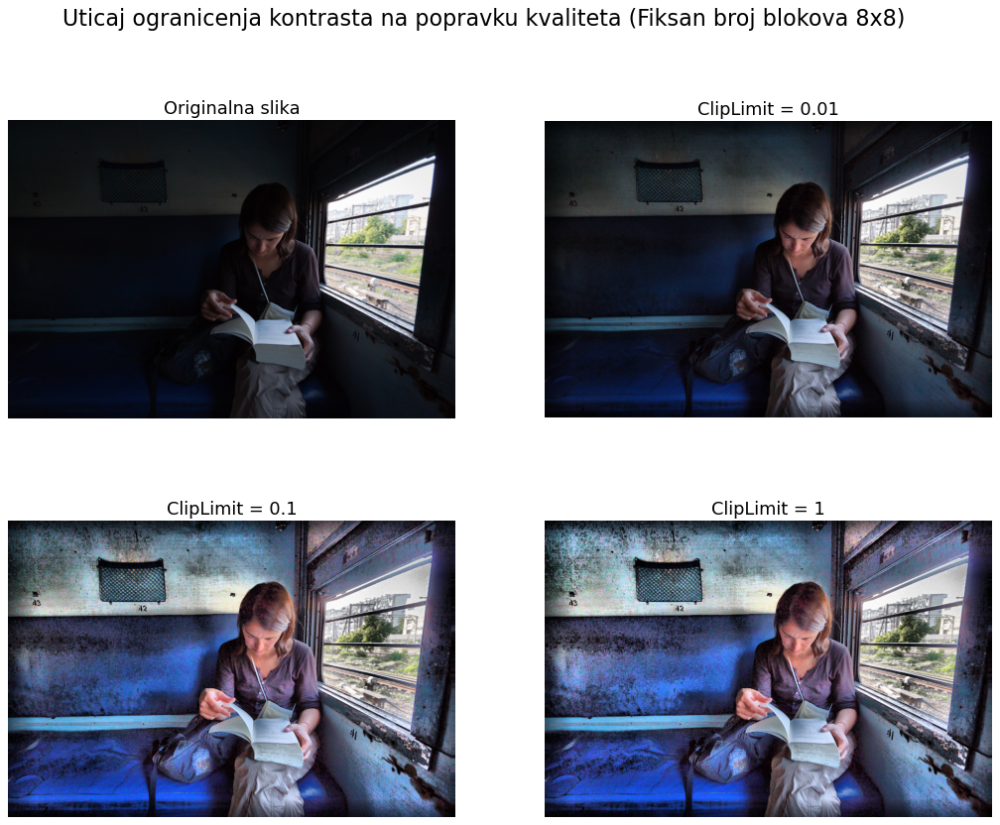

In [114]:
# Uticaj parametra clipLimit 
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,12), dpi=80)
fig.suptitle('Uticaj ogranicenja kontrasta na popravku kvaliteta (Fiksan broj blokova 8x8)', fontsize = 20)

img = io.imread("train.jpg")

ax[0,0].imshow(img); 
ax[0,0].set_title('Originalna slika', fontsize=16); 
ax[0,0].axis('off')

imgOut1 = dosCLAHE("train.jpg",  [8, 8], 0.01)
ax[0,1].imshow(imgOut1); 
ax[0,1].set_title('ClipLimit = 0.01', fontsize=16); 
ax[0,1].axis('off')

imgOut2 = dosCLAHE("train.jpg",  [8, 8], 0.1)
ax[1,0].imshow(imgOut2); 
ax[1,0].set_title('ClipLimit = 0.1', fontsize=16); 
ax[1,0].axis('off');

imgOut3 = dosCLAHE("train.jpg",  [8, 8], 1)
ax[1,1].imshow(imgOut3); 
ax[1,1].set_title('ClipLimit = 1', fontsize=16); 
ax[1,1].axis('off');

### Uticaj ogranicenja kontrasta na popravku kvaliteta (Fiksan broj blokova 8x8)

Ograničenje kontrasta (limit) ima značajan uticaj na popravku kvaliteta slike kada se koristi fiksni broj blokova (na primer, 8x8). 

#### Limit = 0:

Bez ograničenja kontrasta, sva lokalna poboljšanja kontrasta primenjuju se bez ikakvih ograničenja. Ovo može rezultirati pojačanim šumom, naročito na područjima sa malim kontrastom.

#### Niski limiti ->  0.01:

Niski limiti kontrasta ograničavaju jačinu lokalnih poboljšanja. Ovo može biti korisno za sprečavanje preteranog pojačavanja šuma, ali takođe može dovesti do slabijih poboljšanja kontrasta na područjima gde je to potrebno.

#### Srednji limiti -> 0.1:

Ove vrednosti limita mogu pružiti dobar odnos između poboljšanja kontrasta i kontrole suma. Kontrast se značajno poboljšava na lokalnom nivou, a sum se umanjuje u odnosu na situaciju bez ograničenja.

#### Visoki limiti ->1:

Visoki limiti kontrasta (blizu vrednosti 1) mogu ograničiti efekte lokalnih poboljšanja na područjima gde je kontrast već bio značajan. Ovo može rezultirati manje izraženim poboljšanjima u određenim delovima slike, posebno na mestima gde su kontrasti već bili visoki.

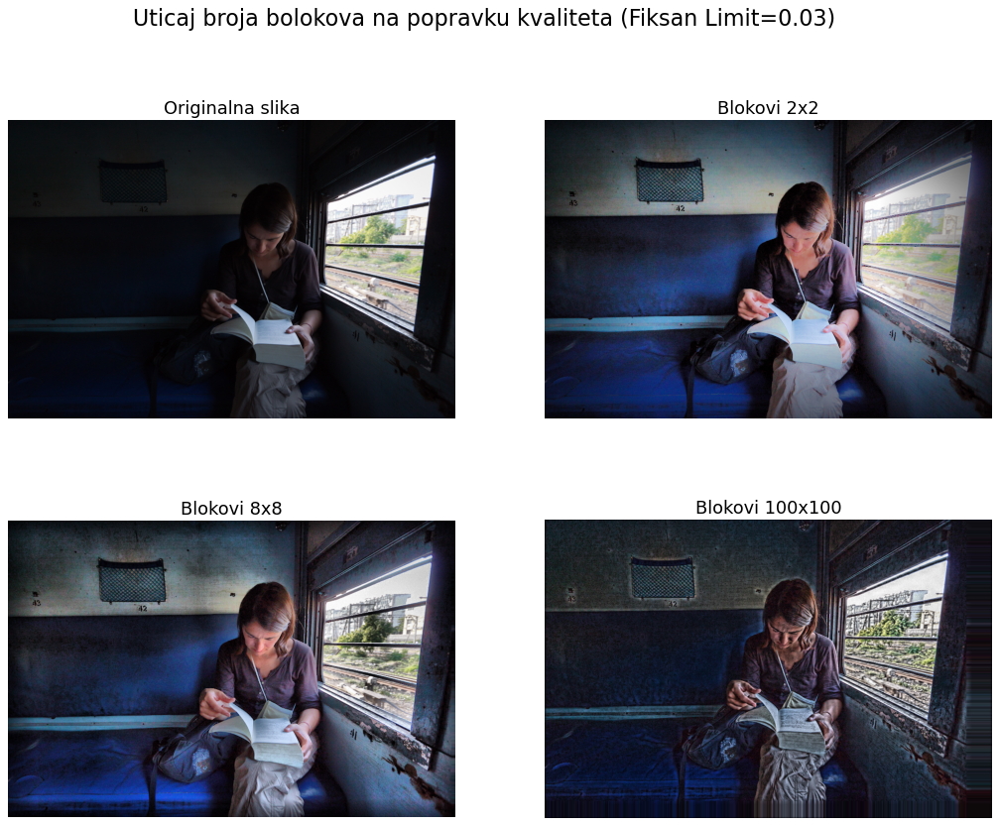

In [106]:
# Uticaj parametra numTiles
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,12), dpi=80)
fig.suptitle('Uticaj broja bolokova na popravku kvaliteta (Fiksan Limit=0.03)', fontsize=20)

img = io.imread("train.jpg")
    
ax[0,0].imshow(img); 
ax[0,0].set_title('Originalna slika', fontsize=16); 
ax[0,0].axis('off')

imgOut1 = dosCLAHE("train.jpg", [2, 2], 0.03)
ax[0,1].imshow(imgOut1); 
ax[0,1].set_title('Blokovi 2x2', fontsize=16); 
ax[0,1].axis('off')

imgOut2 = dosCLAHE("train.jpg", [8, 8], 0.03)
ax[1,0].imshow(imgOut2); 
ax[1,0].set_title('Blokovi 8x8', fontsize=16); 
ax[1,0].axis('off');

imgOut3 = dosCLAHE("train.jpg", [100, 100], 0.03)
ax[1,1].imshow(imgOut3); 
ax[1,1].set_title('Blokovi 100x100', fontsize=16); 
ax[1,1].axis('off');

### Uticaj broja bolokova na popravku kvaliteta (Fiksan Limit=0.03)',

Promenom broja blokova po vertikali i horizontali pri primeni CLAHE se moze uticati na rezultate postupka adaptivne ekvalizacije histograma. Ovaj parametar određuje kako će slika biti podeljena na manje blokove, na koje se zatim primenjuje lokalna ekvalizacija histograma. 

#### 1. Manji broj blokova: 
Osetljivijvost na lokalne kontraste je izrazenija, pa može bolje naglasiti male detalje.

#### 2. Veći broj blokova:
Primenom veceg broja blokova po horizontali i verikali dolazi do manje osetljivosti na male detalje, pa moze doci do gubitka informacija o finim detaljima. Primetne su granice blokova i povecanje suma. 
Izlazna slika na ivicama ima izrazito lose karakteristike. Ivicni delovi slike se izduzuju.

#### 3. Optimalan izbor:
Odabir odgovarajućeg broja blokova zavisi od specifičnosti slike. Kombinacia gde je limit = 0.03 i broj 8 blokova po verikali i horizontali daje najoptimalniji rezultat. Izlazna slika ima popravljen kontrast, ocuvani su detalji i u tamnim i u svetlim delovima scene, slika nema sum.

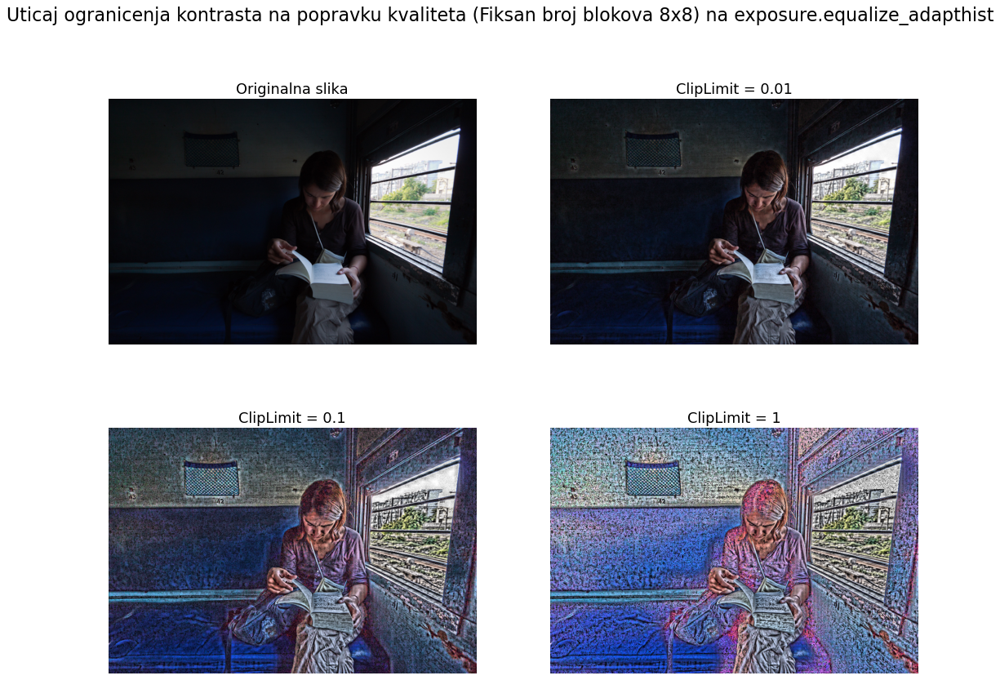

In [109]:
# Uticaj parametra clipLimit na exposure.equalize_adapthist
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,12), dpi=80)
fig.suptitle('Uticaj ogranicenja kontrasta na popravku kvaliteta (Fiksan broj blokova 8x8) na exposure.equalize_adapthist', fontsize = 20)

ax[0,0].imshow(img); 
ax[0,0].set_title('Originalna slika', fontsize=16); 
ax[0,0].axis('off')

imgOut1 = exposure.equalize_adapthist(img,  [8, 8], 0.01)
ax[0,1].imshow(imgOut1); 
ax[0,1].set_title('ClipLimit = 0.01', fontsize=16); 
ax[0,1].axis('off')

imgOut2 = exposure.equalize_adapthist(img,  [8, 8], 0.1)
ax[1,0].imshow(imgOut2); 
ax[1,0].set_title('ClipLimit = 0.1', fontsize=16); 
ax[1,0].axis('off');

imgOut3 = exposure.equalize_adapthist(img,  [8, 8], 1)
ax[1,1].imshow(imgOut3); 
ax[1,1].set_title('ClipLimit = 1', fontsize=16); 
ax[1,1].axis('off');

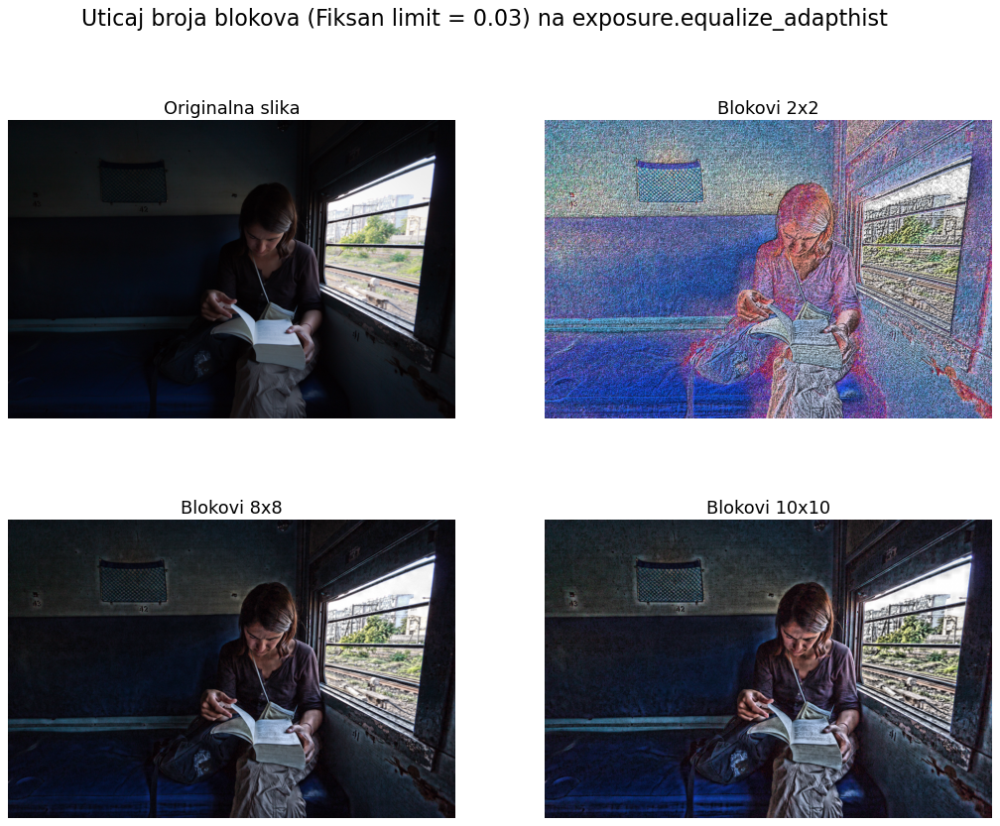

In [112]:
# Uticaj parametra clipLimit na exposure.equalize_adapthist
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,12), dpi=80)
fig.suptitle('Uticaj broja blokova (Fiksan limit = 0.03) na exposure.equalize_adapthist', fontsize = 20)

ax[0,0].imshow(img); 
ax[0,0].set_title('Originalna slika', fontsize=16); 
ax[0,0].axis('off')

imgOut1 = exposure.equalize_adapthist(img,  [2, 2], 0.03)
ax[0,1].imshow(imgOut1); 
ax[0,1].set_title('Blokovi 2x2', fontsize=16); 
ax[0,1].axis('off')

imgOut2 = exposure.equalize_adapthist(img,  [8, 8], 0.03)
ax[1,0].imshow(imgOut2); 
ax[1,0].set_title('Blokovi 8x8', fontsize=16); 
ax[1,0].axis('off');

imgOut3 = exposure.equalize_adapthist(img,  [10, 10], 0.03)
ax[1,1].imshow(imgOut3); 
ax[1,1].set_title('Blokovi 10x10', fontsize=16); 
ax[1,1].axis('off');

Posmatranjem dobijenh rezultata primenom dosCLAHE i ugradjene funkcije za razlicite vrednosti parametara limit i broj blokova, mogu da zakljucim da se funkcije isto ponasaju osim u slucaju za mali broj blokova i veliki limit.

Ugradjena funkcija koristi optimizovanije algoritme kao i razlicite podrazumevane parametre. Iz tog razloga slika dobijena primenom equalize_adapthist za iste vrednosti parametara ima razlicite performanse.

In [28]:
import time
# Funkcija za merenje vremena izvršavanja
def measure_execution_time(function, *args, **kwargs):
    """
    Mere vreme izvršavanja zadate funkcije.

    Parameters:
        - function: Funkcija čije se vreme izvršavanja meri.
        - *args: Dodatni argumenti za funkciju.
        - **kwargs: Dodatni ključevi i vrednosti za funkciju.

    Returns:
        - execution_time: Vreme izvršavanja funkcije u sekundama.
    """
    start_time = time.time()  # Započinje merenje vremena pre izvršavanja funkcije
    function(*args, **kwargs)  # Poziva zadatu funkciju
    end_time = time.time()  # Završava merenje vremena nakon izvršavanja funkcije
    execution_time = end_time - start_time  # Računa ukupno vreme izvršavanja
    return execution_time  # Vraća vreme izvršavanja u sekundama

In [44]:
img = io.imread("train.jpg")

num_blocks_list = [1, 4, 8, 16]
limit_values = [0, 0.01, 0.1, 1.0]

Vreme izvršavanja za 1 blokova i ograničenje 0: 2.278s
Vreme izvršavanja normalizovano: 1.576 us/pix

Vreme izvršavanja za 1 blokova i ograničenje 0.01: 2.17s
Vreme izvršavanja normalizovano: 1.501 us/pix

Vreme izvršavanja za 1 blokova i ograničenje 0.1: 2.165s
Vreme izvršavanja normalizovano: 1.497 us/pix

Vreme izvršavanja za 1 blokova i ograničenje 1.0: 2.138s
Vreme izvršavanja normalizovano: 1.479 us/pix

Vreme izvršavanja za 4 blokova i ograničenje 0: 2.349s
Vreme izvršavanja normalizovano: 1.624 us/pix

Vreme izvršavanja za 4 blokova i ograničenje 0.01: 2.358s
Vreme izvršavanja normalizovano: 1.631 us/pix

Vreme izvršavanja za 4 blokova i ograničenje 0.1: 2.342s
Vreme izvršavanja normalizovano: 1.62 us/pix

Vreme izvršavanja za 4 blokova i ograničenje 1.0: 2.363s
Vreme izvršavanja normalizovano: 1.634 us/pix

Vreme izvršavanja za 8 blokova i ograničenje 0: 2.856s
Vreme izvršavanja normalizovano: 1.975 us/pix

Vreme izvršavanja za 8 blokova i ograničenje 0.01: 2.848s
Vreme izvrša

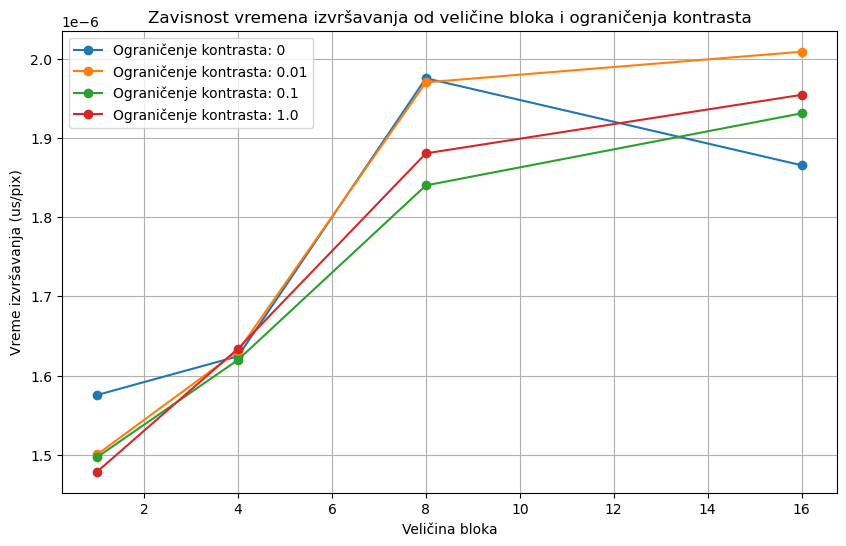

In [45]:
# Testiranje dosCLAHE za različite vrednosti broja blokova i ograničenja kontrasta

execution_time_matrix = np.zeros((len(num_blocks_list), len(limit_values), 2))

for i, num_blocks in enumerate(num_blocks_list):
    for j, limit in enumerate(limit_values):
        # Merenje vremena izvršavanja
        execution_time = measure_execution_time(dosCLAHE, "train.jpg", numTiles=[num_blocks, num_blocks], limit=limit)
        execution_time_matrix[i, j, 0] = execution_time

        # Normalizacija vremena izvršavanja sa brojem piksela u slici
        execution_time_norm = execution_time / np.size(img)
        execution_time_matrix[i, j, 1] = execution_time_norm

        print(f"Vreme izvršavanja za {num_blocks} blokova i ograničenje {limit}: {round(execution_time, 3)}s")
        print(f"Vreme izvršavanja normalizovano: {round(execution_time_norm * 1e6, 3)} us/pix\n")

# Crtanje grafikona
plt.figure(figsize=(10, 6))

for j, limit in enumerate(limit_values):
    plt.plot(num_blocks_list, execution_time_matrix[:, j, 1], marker='o', label=f'Ograničenje kontrasta: {limit}')

plt.title("Zavisnost vremena izvršavanja od veličine bloka i ograničenja kontrasta")
plt.xlabel("Veličina bloka")
plt.ylabel("Vreme izvršavanja (us/pix)")
plt.legend()
plt.grid(True)
plt.show()

### Zavisnost vremena izvršavanja od veličine bloka i ograničenja kontrasta

Odabir limita i broja blokova  može značajno uticati na brzinu procesiranja slike pomoću CLAHE (Contrast Limited Adaptive Histogram Equalization). 

#### Broj blokova:

Povećanje broja blokova obično dovodi do povećanja vremena izvršavanja. To je zato što se adaptivna ekvalizacija histograma primenjuje na svaki blok zasebno, pa veći broj blokova zahteva više iteracija kroz sliku.
Manji broj blokova može dovesti do bržeg izvršavanja, ali može uticati na sposobnost algoritma da pravilno prilagodi lokalne kontraste.

#### Limit kontrasta:

Niski limiti kontrasta (blizu nule) obično zahtevaju manje promene u lokalnim histogramima i mogu dovesti do bržeg izvršavanja. Međutim, to takođe može rezultirati manjim poboljšanjem kontrasta.
Visoki limiti kontrasta mogu rezultirati većim promenama u histogramima, što može zahtevati više računarskih resursa i povećati vreme izvršavanja.

Vreme izvršavanja za 1 blokova i ograničenje 0: 0.438s
Vreme izvršavanja normalizovano: 0.303 us/pix

Vreme izvršavanja za 1 blokova i ograničenje 0.01: 0.45s
Vreme izvršavanja normalizovano: 0.311 us/pix

Vreme izvršavanja za 1 blokova i ograničenje 0.1: 0.49s
Vreme izvršavanja normalizovano: 0.339 us/pix

Vreme izvršavanja za 1 blokova i ograničenje 1.0: 0.445s
Vreme izvršavanja normalizovano: 0.308 us/pix

Vreme izvršavanja za 4 blokova i ograničenje 0: 0.39s
Vreme izvršavanja normalizovano: 0.27 us/pix

Vreme izvršavanja za 4 blokova i ograničenje 0.01: 0.36s
Vreme izvršavanja normalizovano: 0.249 us/pix

Vreme izvršavanja za 4 blokova i ograničenje 0.1: 0.385s
Vreme izvršavanja normalizovano: 0.266 us/pix

Vreme izvršavanja za 4 blokova i ograničenje 1.0: 0.357s
Vreme izvršavanja normalizovano: 0.247 us/pix

Vreme izvršavanja za 8 blokova i ograničenje 0: 0.369s
Vreme izvršavanja normalizovano: 0.255 us/pix

Vreme izvršavanja za 8 blokova i ograničenje 0.01: 0.379s
Vreme izvršavan

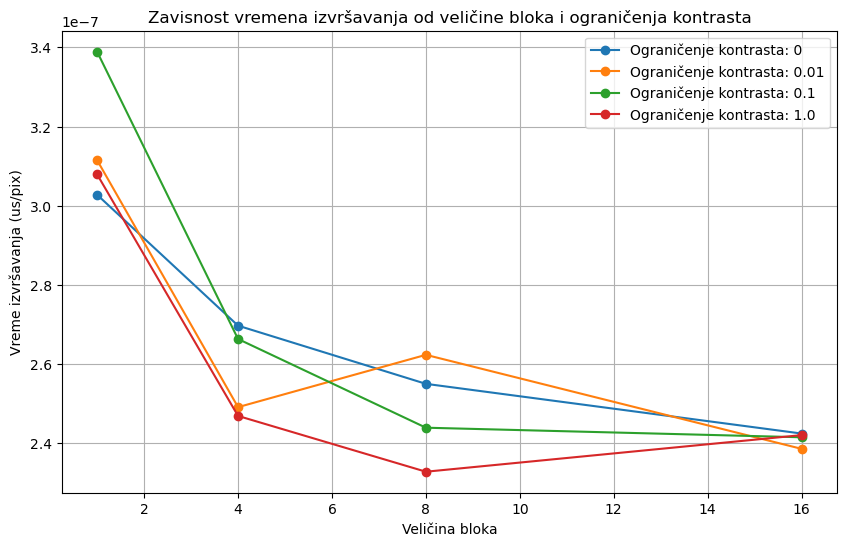

In [50]:
# Testiranje equalize_adapthist za različite vrednosti broja blokova i ograničenja kontrasta

execution_time_matrix_1 = np.zeros((len(num_blocks_list), len(limit_values), 2))

for i, num_blocks in enumerate(num_blocks_list):
    for j, limit in enumerate(limit_values):
        # Merenje vremena izvršavanja
        execution_time_1 = measure_execution_time(exposure.equalize_adapthist, img, [img.shape[0]/num_blocks, img.shape[1]/num_blocks], limit)
        execution_time_matrix_1[i, j, 0] = execution_time_1

        # Normalizacija vremena izvršavanja sa brojem piksela u slici
        execution_time_norm_1 = execution_time_1 / np.size(img)
        execution_time_matrix_1[i, j, 1] = execution_time_norm_1

        print(f"Vreme izvršavanja za {num_blocks} blokova i ograničenje {limit}: {round(execution_time_1, 3)}s")
        print(f"Vreme izvršavanja normalizovano: {round(execution_time_norm_1 * 1e6, 3)} us/pix\n")

# Crtanje grafikona
plt.figure(figsize=(10, 6))

for j, limit in enumerate(limit_values):
    plt.plot(num_blocks_list, execution_time_matrix_1[:, j, 1], marker='o', label=f'Ograničenje kontrasta: {limit}')

plt.title("Zavisnost vremena izvršavanja od veličine bloka i ograničenja kontrasta")
plt.xlabel("Veličina bloka")
plt.ylabel("Vreme izvršavanja (us/pix)")
plt.legend()
plt.grid(True)
plt.show()

### Zavisnost vremena izvršavanja od veličine bloka i ograničenja kontrasta

Vreme izvršavanja ugrađene funkcije exposure.equalize_adapthist za različite vrednosti broja blokova i limita kontrasta pokazuje sledeće karakteristike:

#### 1.Stabilnost u vremenu izvršavanja:

Za svaku vrednost broja blokova i limita kontrasta, vreme izvršavanja se održava relativno stabilnim.

#### 2. Normalizovano vreme izvršavanja po pikselu:

Normalizovano vreme izvršavanja po pikselu ostaje nisko, što sugeriše na efikasnost funkcije u radu sa slikama različitih dimenzija.Ovo je posebno važno u situacijama gde se obrađuju slike različitih rezolucija.

#### 3. Blagi trendovi u vremenu izvršavanja:

Postoji blagi trend u vremenu izvršavanja sa promenom limita kontrasta.

Ugrađene funkcije exposure.equalize_adapthist za različite vrednosti broja blokova i limita kontrasta se dosta brze izvrsava nego funkcija dosCLAHE.